# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 3. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 2.**

---

**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 60 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [324]:
# Bot check

# HW_ID: fpmi_ad3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: not final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [448]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

### <font color="blue"><i>Легкая часть</i></font>


### Задача 1.

На занятии мы уже <a href="https://miptstats.github.io/courses/ad_fivt/titanik.html" target="_blank">начинали</a> работать с датасетом Титаник. Сейчас ваша задача &mdash; на основе простого анализа предоставленных данных получить некоторое приближенное правило определения, выжил пассажир или нет.

#### 1. Подготовка данных

Загрузите данные с помощью `pandas`.

In [326]:
df = pd.read_csv("titanic.csv", index_col=0)
df

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,,,,,,,,,,,
1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S


Разделите данные по строкам на две части случайным образом в соотношении 7:3. Первую часть мы будем называть *обучающей*, а вторую &mdash; *тестовой*.

In [327]:
train_data = df.sample(frac=0.7)
test_data = df.drop(train_data.index)

Размер обучающей выборки:

In [328]:
train_data.shape[0]

624

Размер тестовой выборка:

In [329]:
test_data.shape[0]

267

Из каждой части оставим несколько признаков, с которыми мы будем работать, а также отдельно &mdash; целевой признак. Примените к обеим частям таблицы функцию ниже

In [330]:
features_columns = ['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare']
target_column = 'Survived'  # Целевой признак

def get_features_and_target(data):
    features = data[features_columns]
    target = data[target_column]
    return features, target

In [351]:
train_features, train_target = get_features_and_target(train_data)
test_features, test_target = get_features_and_target(test_data)

Таблица с признаками:

In [353]:
train_features.head()

,Pclass,Sex,Age,SibSp,Parch,Fare
PassengerId,,,,,,
733,2,male,NaN,0,0,0.0000
592,1,female,52.0,1,0,78.2667
808,3,female,18.0,0,0,7.7750
126,3,male,12.0,1,0,11.2417
379,3,male,20.0,0,0,4.0125


Целевая переменная:

In [354]:
train_target

PassengerId
733    0
592    1
808    0
126    1
379    0
      ..
790    0
389    0
123    0
194    1
796    0
Name: Survived, Length: 624, dtype: int64

#### 2. Исследование

**Внимание.** Эта часть задачи должна выполняться *исключительно на обучающих данных*. За использование тестовых данных решение не будет оценено.

Проведите визуальный анализ данных чтобы понять, как различные признаки влияют на целевой. Исследовать можно не целиком обучающие данные, а разделить их на две части по одному из признаков, а далее рассматривать каждую часть отдельно. 

*Не забывайте про информативность и эстетичность графиков.*

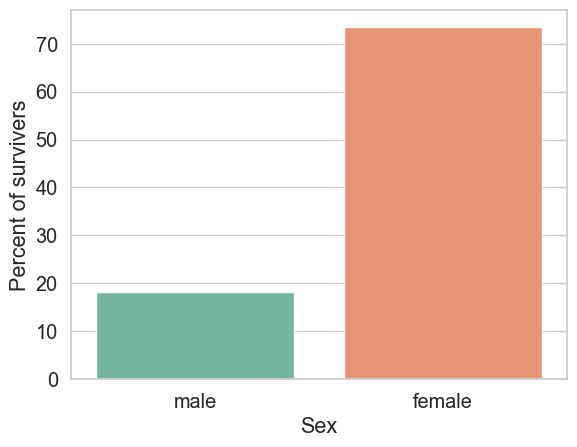

In [332]:
sex_bar = sns.barplot(x=train_features["Sex"], y=train_target, orient='v', estimator=lambda x: 100 * np.mean(x), errorbar=None)
sex_bar.set(ylabel='Percent of survivers')
plt.show()

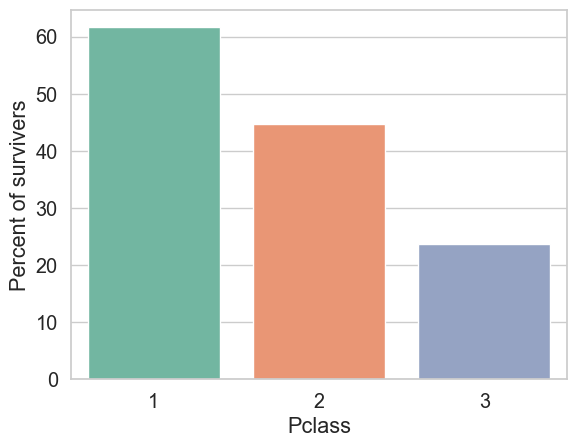

In [333]:
pclass_bar = sns.barplot(x=train_features["Pclass"], y=train_target, errorbar=None, estimator=lambda x: 100 * np.mean(x))
pclass_bar.set(ylabel='Percent of survivers')
plt.show()

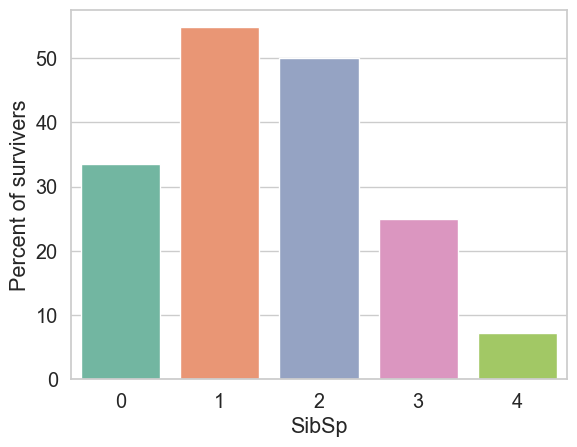

In [334]:
SibSp_bar = sns.barplot(x=train_features["SibSp"], y=train_target, errorbar=None, estimator=lambda x: 100 * np.mean(x), order=[0, 1, 2, 3, 4])
SibSp_bar.set(ylabel='Percent of survivers')
plt.show()

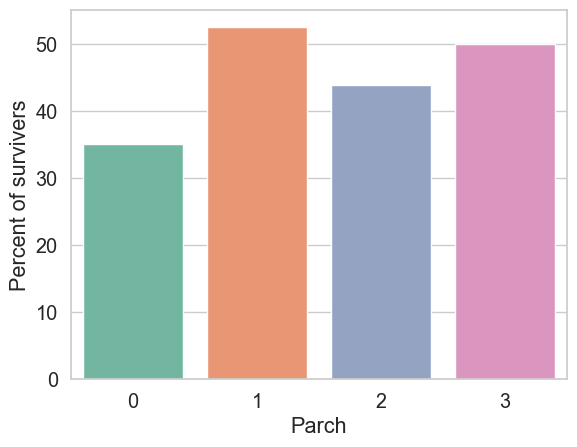

In [347]:
parch_bar = sns.barplot(x=train_features["Parch"], y=train_target, errorbar=None, estimator=lambda x: 100 * np.mean(x), order=[0, 1, 2, 3])
parch_bar.set(ylabel='Percent of survivers')
plt.show()

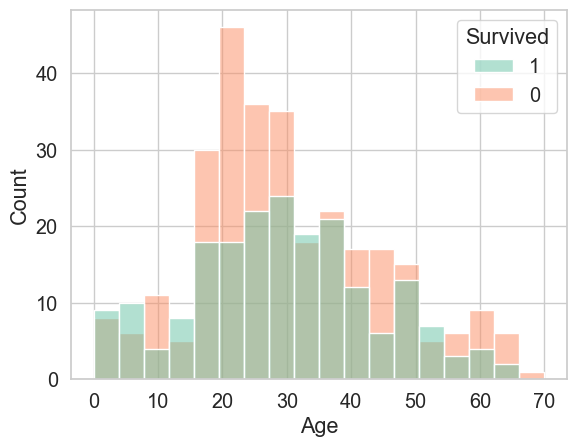

In [336]:
sns.histplot(data=train_data, x="Age", hue='Survived', bins=18, hue_order=[1, 0], stat='count', binrange=(0, 70))
plt.show()

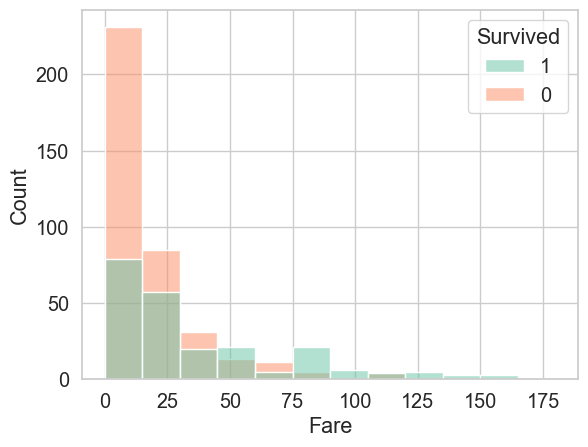

In [337]:
sns.histplot(data=train_data, x="Fare", hue='Survived', stat='count', bins=12, binrange=(0, 180), hue_order=[1, 0])
plt.show()

Из графиков можно сделать **несколько выводов**:
* с большой вероятностью выживают женщины, в отличие от мужчин;
* чем выше класс пассажира, тем больше у него шансов остаться в живых;
* возраст и число родственников на корабле несильно влияет на шанс выживания;
* заплатившие более 75 денежных единиц за проезд в большинстве случаев выживают.

#### 3. Классификация

На основе проведенного исследования предложите два разных правила в виде решающего дерева, пример которого можете посмотреть в презентации с первой лекции (классификация котиков). Никакие статистические методы использовать не требуется, только логику и графики.

В данной задаче достаточно, если первое дерево будет иметь максимальную глубину 2, а второе &mdash; глубину 1, и при этом не является поддеревом первого. *Примечание*: дерево из одного листа имеет глубину 0.

**Дерево 1:**

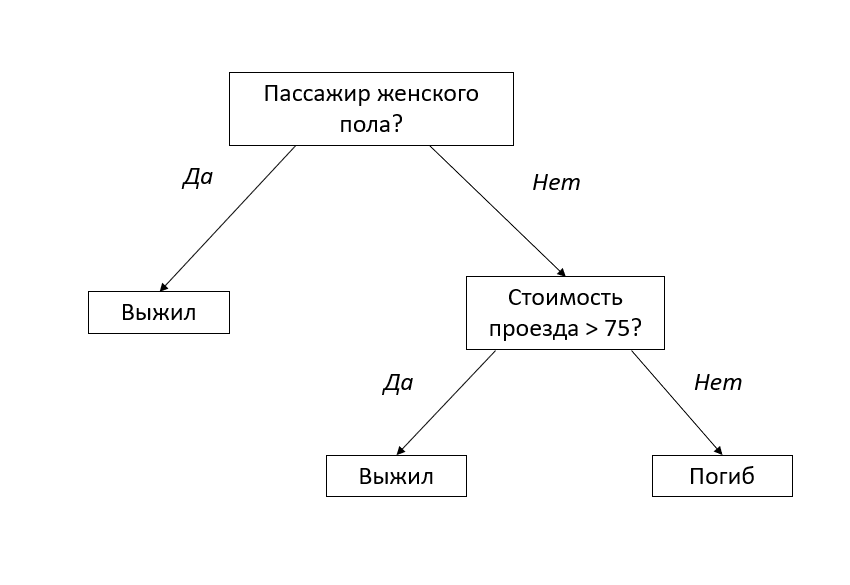

**Дерево 2:**

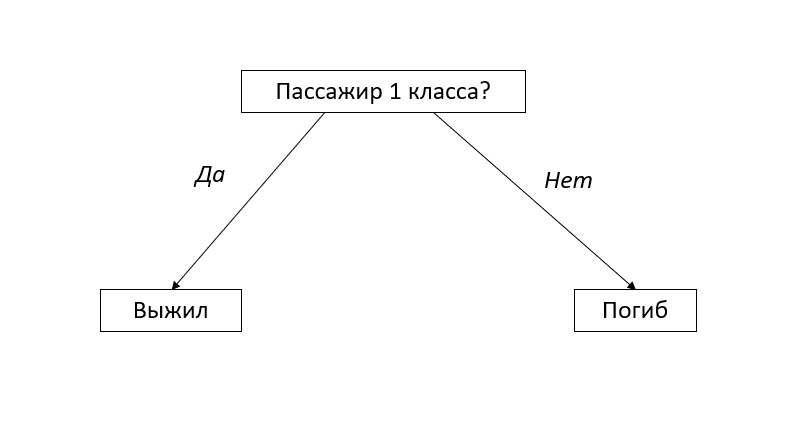

Реализуйте полученные деревья по шаблону

In [338]:
def tree1(features):
    '''
    Предсказание целевого признака по модели 1 дерева для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    '''
    first_step = features["Sex"].apply(lambda x: True if x == 'female' else False)
    second_step = features["Fare"].apply(lambda x: True if x >= 75 else False)
    predicted = (first_step + second_step).apply(lambda x: 1 if x == True else 0)
    return predicted

In [339]:
def tree2(features):
    '''
    Предсказание целевого признака по модели 2 дерева для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    '''
    predicted = features["Pclass"].apply(lambda x: 1 if x == 1 else 0)
    return predicted

#### 4. Качество

Вспомним, что у нас имеется тестовая часть выборки. Самое время ее использовать для того, чтобы оценить, насколько хорошими получились деревья. Предложите какой-нибудь критерий качества.

*Замечание*. Не стоит пытаться искать, какие критерии существуют. В данном случае легко предложить адекватный критерий. Стандартные критерии мы разберем позже, но для начала лучше подумать самостоятельно.

**Критерий:**

*Процент правильных предсказаний*

Реализуйте данный критерий по шаблону

In [340]:
def criteria(target, predicted):
    '''
    Вычисление критерия качества для предсказания predicted, 
    если истинные значения -- target.
    Возвращает одно вещественное число.
    '''
    correct_pred_cnt = (target == predicted).apply(lambda x: 1 if x == True else 0).sum()
    metric = 100 * correct_pred_cnt / target.shape[0]
    return metric

Посчитайте качество полученных ранее деревьев.

*Примечание.* Полученные значения не влияют на оценку по задание. Оценивается только корректность и обоснованность решения, а также графики и выводы.

Расчитаем метрику для 1 модели:

In [341]:
pred_tree1 = tree1(test_features)
tree1_metric = criteria(test_target, pred_tree1 )
print("Модель №1 правильно предсказывает выживание пассажира с точностью {:.1f}%".format(tree1_metric))

Модель №1 правильно предсказывает выживание пассажира с точностью 79.0%


Расчитаем метрику для 2 модели:

In [342]:
pred_tree2 = tree2(test_features)
tree2_metric = criteria(test_target, pred_tree2)
print("Модель №2 правильно предсказывает выживание пассажира с точностью {:.1f}%".format(tree2_metric))

Модель №2 правильно предсказывает выживание пассажира с точностью 67.4%


**5. Метод ближайшего соседа**

В домашнем задании 1 вы уже реализовали функцию поиска ближайших соседей. Теперь давайте применим ее для решения нашей текущей задачи. 

Реализуйте функцию, которая для каждого объекта тестового набора данных найдет $k$ ближайших соседей из обучающего набора данных, и в качестве ответа возьмет наиболее часто встречающееся значение целевого признака среди найденных соседей. Обратите внимание, что соседей необходимо искать только среди объектов обучающего набора данных.

In [343]:
def knn(features, train_features, train_target, k=1):
    '''
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    на основе обучающего набора данных train_features, train_target.
    Возвращает pandas.Series с теми же индексами, что и у features.
    Число k -- количество соседей.
    '''
    # Сделаем копии и переведем категориальную переменную в числовую
    features = features.copy()
    features["Sex"] = features["Sex"].apply(lambda x: 1 if x == 'male' else 0)
    
    train_features = train_features.copy()
    train_features["Sex"] = train_features["Sex"].apply(lambda x: 1 if x == 'male' else 0)

    series_dict = {}  # словарь для преобразования в объект Series для требуемого ответа в конце функции
    for i in range(features.shape[0]):
        raw_index = features.iloc[i].name
        raw_list = features.iloc[i].to_list()
        detailed_table = train_features.copy()
        
        # считаем расстояние до каждой точки из обучающей выборки
        detailed_table["Distance"] = ((train_features - raw_list) * (train_features - raw_list)).sum(axis=1)
        detailed_table["Distance"] = detailed_table["Distance"].apply(np.sqrt)
        
        # Оставим только k ближайших соседей
        detailed_table = detailed_table.sort_values(by='Distance', ascending=True)[0:k]
        
        # Воспользуемся методом весов для предсказания класса объекта
        detailed_table = detailed_table.merge(train_target, how='inner', left_index=True, right_index=True)
        detailed_table["InverseDistance"] = detailed_table["Distance"].apply(lambda x: 1/x if x > 0 else 1000000)
        status = detailed_table.groupby(by="Survived").sum()["InverseDistance"].idxmax()

        # Записываем предсказание вметсе с ID пассажира
        series_dict[raw_index] = status      
    
    predicted = pd.Series(data=series_dict)
    return predicted

Посчитайте значение предложенного ранее критерия качества для метода ближайшего соседа для значений $k$ от 1 до 10. Постройте график зависимости критерия качества от $k$. Как вы можете пояснить полученные результаты?

In [344]:
x_values = []
k_values = [x for x in range(1, 11)]
for k in k_values:
    prediction = knn(test_features, train_features, train_target, k=k)
    right_answers_percent = criteria(test_target, prediction)
    x_values.append(right_answers_percent)

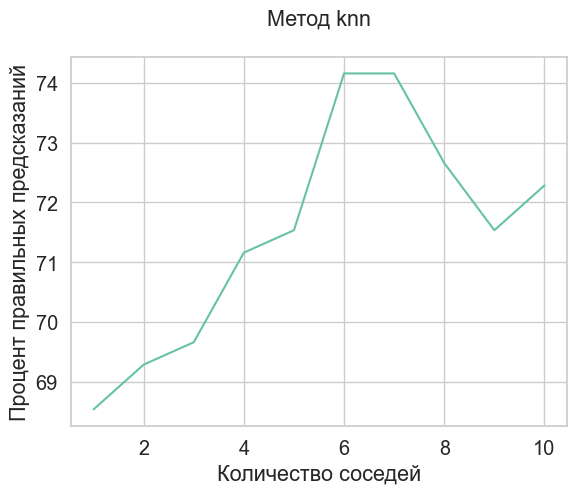

In [350]:
plt.plot(k_values, x_values)
plt.xlabel("Количество соседей")
plt.ylabel("Процент правильных предсказаний")
plt.title("Метод knn\n")
plt.show()

Из графика видно, что на отрезке [1, 6] с увеличением числа соседей растет и точность предсказания вплоть до 74%, что связано с более подробным учетом окружения объекта. Далее значение метрики начинает колебаться вблизи 73%, что связано с выходом на константу для взвешенного метода knn: ведь чем больше расстояние до соседа, тем меньший вклад он вносит в функцию оценки класса объекта. Поэтому учет более далеких соседей будет слабо влиять на дальнейшее качество предсказаний.

#### 6. Выводы

Для предсказания выживания пассажира Титаника было построены 3 модели на обучающих данных. Две из них эврестические и описываются решающими деревьями, последняя построена на основе метода ближайших соседей. Качество моделей было оценено на тестовой выборке метрикой, заключающейся в процентном количестве правильных предсказаний.
* Дерево 1: 79% правильных ответов
* Дерево 2: 67% верных предсказаний
* Метод ближайших соседей: 74% (k=5)
 
Таким образом наилучшая модель для предсказывания выживания пассажира - это **дерево 1**, берущее за основу значения двух признаков (Sex и Fare)


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

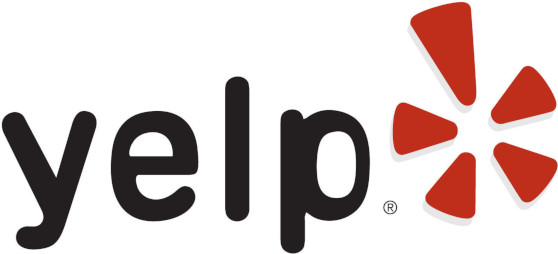

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [610]:
buiseness_df = pd.read_json('yelp_business.json', lines=True)
buiseness_df.head()

,business_id,name,address,city,state,latitude,longitude,categories
0,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,38.551126,-90.335695,"Shipping Centers, Local Services, Notaries, Ma..."
1,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,39.955505,-75.155564,"Restaurants, Food, Bubble Tea, Coffee & Tea, B..."
2,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,36.269593,-87.058943,"Burgers, Fast Food, Sandwiches, Food, Ice Crea..."
3,qkRM_2X51Yqxk3btlwAQIg,Temple Beth-El,400 Pasadena Ave S,St. Petersburg,FL,27.766590,-82.732983,"Synagogues, Religious Organizations"
4,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,36.208102,-86.768170,"Ice Cream & Frozen Yogurt, Fast Food, Burgers,..."


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [611]:
buiseness_df.groupby('city').count()["business_id"].sort_values(ascending=False).rename('companies_count').head()

city
Philadelphia    7236
Tucson          4626
Tampa           4573
Indianapolis    3799
Nashville       3463
Name: companies_count, dtype: int64

Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

<Axes: xlabel='longitude', ylabel='latitude'>

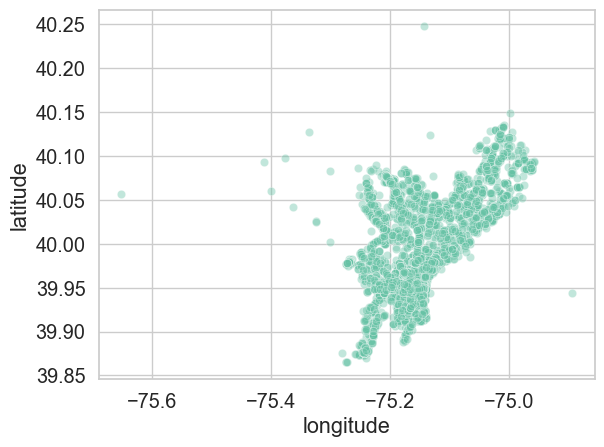

In [612]:
philadelphia_df = buiseness_df[buiseness_df['city'] == 'Philadelphia']

sns.scatterplot(philadelphia_df, x='longitude', y='latitude', alpha=0.4)

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

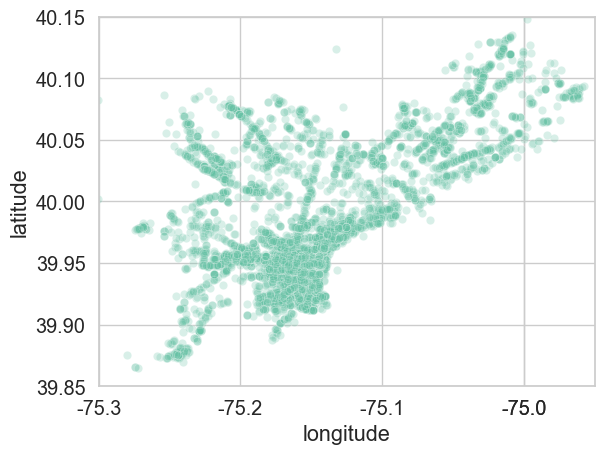

In [613]:
scatter_graph = sns.scatterplot(philadelphia_df, x='longitude', y='latitude', alpha=0.25)

x_grid = np.around(np.linspace(-75.3, -74.95, 5), decimals=1)
scatter_graph.set_xlim(-75.3, -74.95)
scatter_graph.set_ylim(39.85, 40.15)
scatter_graph.set_xticks(x_grid) # <--- set the ticks first
scatter_graph.set_xticklabels(x_grid)
plt.show()

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб. Рекомендуется сохранить карту в html и отправить ее отдельным файлом в бот.

In [614]:
philadelphia_df_sample = philadelphia_df.sample(frac=0.05)  # чтобы интерактивная карта не лагала

In [615]:
lat = philadelphia_df_sample['latitude']
lon = philadelphia_df_sample['longitude']
company_name = philadelphia_df_sample['name']

# создадим объект-карту и добавим к ней объект-кластер-марекров для того, чтобы точки на карте группировались
map = folium.Map(location=[40.0,-75.12], zoom_start = 9, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(map)

# создаем маркеры и добавляем их к кластеру
for lat, lon, company_name in zip(lat, lon, company_name):
    folium.CircleMarker(location=[lat, lon], popup=company_name, radius = 7, fill_color='red', color="blue", fill_opacity = 0.2).add_to(marker_cluster)

# сохрняем карту и отображаем её в ноутбуке
map.save("philadelphia_companies_map.html")
map

Если все получилось, вы молодцы! Далее в этой задаче тоже можно делать интерактивные карты.

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [616]:
review_df = pd.read_json('yelp_review.json', lines=True)

В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [617]:
# В philadelphia_df содержатся в bueseness_id, которых нет в review_df. Из-за этого метод loc будет выдавать ошибку
# Найдем пересечение индексов
ind_intersection = np.intersect1d(philadelphia_df["business_id"].values, review_df[["business_id"]].values)

philadelphia_review_df = review_df.set_index('business_id').loc[ind_intersection].reset_index()

Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [618]:
philadelphia_review_aggr = philadelphia_review_df.groupby(by='business_id').aggregate([np.mean, np.size])

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [619]:
philadelphia_review_aggr.columns = ['mean_rating', 'review_count']
philadelphia_review_aggr.head()

,mean_rating,review_count
business_id,,
--sXnWH9Xm6_NvIjyuA99w,3.800000,15
-0PN_KFPtbnLQZEeb23XiA,3.500000,6
-0fvhILrC9UsQ6gLNpZlTQ,4.555556,9
-1DxQ1CxSc_JCxzKm9bglg,3.000000,7
-1b2kNOowsPrPpBOK4lNkQ,4.222222,9


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [620]:
philadelphia_sum_table = philadelphia_review_aggr.join(
    philadelphia_df.set_index('business_id')
)[['latitude', 'longitude', 'categories', 'name', 'mean_rating', 'review_count']]

philadelphia_sum_table.head()

,latitude,longitude,categories,name,mean_rating,review_count
business_id,,,,,,
--sXnWH9Xm6_NvIjyuA99w,39.952584,-75.165222,"Public Services & Government, Local Flavor",Philadelphia,3.800000,15
-0PN_KFPtbnLQZEeb23XiA,39.923048,-75.178078,"Restaurants, Chinese",Mr Wong's Chinese Restaurant,3.500000,6
-0fvhILrC9UsQ6gLNpZlTQ,40.046191,-75.015090,"Desserts, Food",David's Southern Fried Pies,4.555556,9
-1DxQ1CxSc_JCxzKm9bglg,39.876593,-75.243194,"Airlines, Transportation, Hotels & Travel",British Airways,3.000000,7
-1b2kNOowsPrPpBOK4lNkQ,39.976618,-75.140844,"Breakfast & Brunch, Colombian, Restaurants, La...",Usaquén,4.222222,9


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

In [621]:
def choose_marker_color(mean_rating):
    '''
    Функция выбора цвета на основе рейтинга
    '''
    if mean_rating <= 1:
        return 'red'
        
    if (mean_rating > 1) and (mean_rating <= 2):
        return 'orange'
        
    if (mean_rating > 2) and (mean_rating <= 3):
        return 'yellow'
        
    if (mean_rating > 3) and (mean_rating <= 4):
        return 'lightgreen'

    if (mean_rating > 4) and (mean_rating <= 5):
        return 'green'
        
    return 'gray'

In [622]:
lat = philadelphia_sum_table['latitude']
lon = philadelphia_sum_table['longitude']
company_name = philadelphia_sum_table['name']
mean_rating = philadelphia_sum_table['mean_rating']

# создадим объект-карту
map = folium.Map(location=[40.0,-75.12], zoom_start = 9, tiles="Cartodb Positron")
#marker_cluster = MarkerCluster().add_to(map)

# создаем маркеры и добавляем их к карте
for lat, lon, company_name, mean_rating in zip(lat, lon, company_name, mean_rating):
    color = choose_marker_color(mean_rating)
    folium.CircleMarker(location=[lat, lon], popup=company_name, radius = 7, fill_color=color, color=None, fill_opacity = 0.2).add_to(map)

# сохрняем карту и отображаем её в ноутбуке
map.save("philadelphia_companies_map_with_color_rating.html")
map

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [623]:
#long_grid = np.linspace(-75.3, -74.95, 5)
#lat_grid = np.linspace(39.85, 40.15, 5)

philadelphia_sum_table_without_round_lat = philadelphia_sum_table.copy()

philadelphia_sum_table['longitude'] = philadelphia_sum_table['longitude'].apply(lambda x: np.round(x * 4, decimals=1) * 0.25)
philadelphia_sum_table['latitude'] = philadelphia_sum_table['latitude'].apply(lambda x: np.round(x * 4, decimals=1) * 0.25)
philadelphia_sum_table.head()

,latitude,longitude,categories,name,mean_rating,review_count
business_id,,,,,,
--sXnWH9Xm6_NvIjyuA99w,39.950,-75.175,"Public Services & Government, Local Flavor",Philadelphia,3.800000,15
-0PN_KFPtbnLQZEeb23XiA,39.925,-75.175,"Restaurants, Chinese",Mr Wong's Chinese Restaurant,3.500000,6
-0fvhILrC9UsQ6gLNpZlTQ,40.050,-75.025,"Desserts, Food",David's Southern Fried Pies,4.555556,9
-1DxQ1CxSc_JCxzKm9bglg,39.875,-75.250,"Airlines, Transportation, Hotels & Travel",British Airways,3.000000,7
-1b2kNOowsPrPpBOK4lNkQ,39.975,-75.150,"Breakfast & Brunch, Colombian, Restaurants, La...",Usaquén,4.222222,9


Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

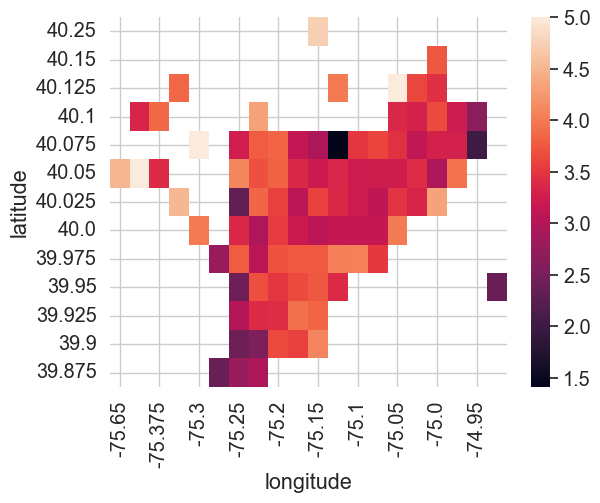

In [624]:
mean_rating_map_table = pd.pivot_table(philadelphia_sum_table, index='latitude', columns='longitude', aggfunc='mean', values='mean_rating')
heatmap_rating = sns.heatmap(mean_rating_map_table)
heatmap_rating.invert_yaxis()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** 
* включая в анализ компании с маленьким количеством отзывов, мы можем сильно повлиять на среднюю оценку района и исказить истинное состояние вещей. Допустим у нас есть два ресторана на одной улице: у первого имеется один отзыв с 1 звездой, а у другого - 100 отзывов с 5. Тогда при нашем подсчете получается средняя оценка 2.5, хотя мы имеем на 100 хороших ревью одно плохое. Так что будет это будет верным решением исключить из анализа компании с маленьким числом отзывов. Плюс, у них слишком мало данных для того, чтобы их средняя оценка сама по себе была репрезентативной.
* Автоподстройка шкалы влияет на визульный анализ и представление данных. Мы не видим весь возможный диапазон оценок и не можем оценить их масштаб.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

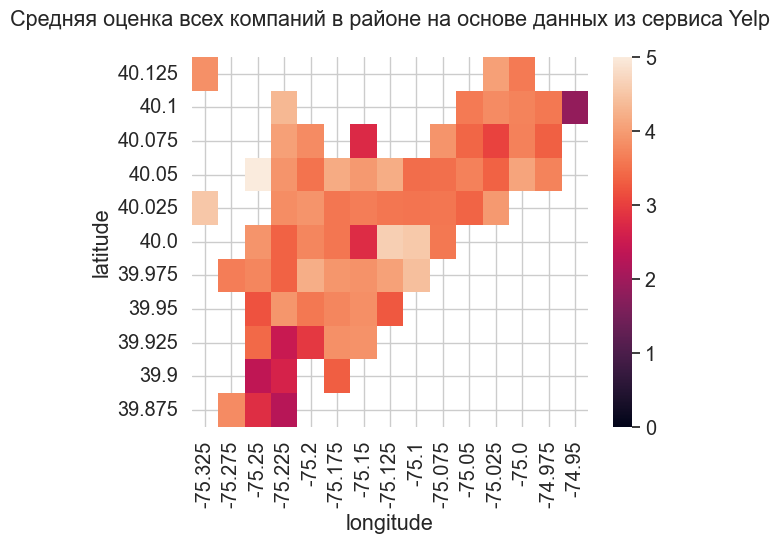

In [625]:
mean_rating_map_table = pd.pivot_table(
    philadelphia_sum_table[philadelphia_sum_table['review_count'] >= 30],
    index='latitude', columns='longitude', aggfunc='mean', values='mean_rating'
)

heatmap_rating = sns.heatmap(mean_rating_map_table, vmin=0, vmax=5)
heatmap_rating.invert_yaxis()
heatmap_rating.set_title("Средняя оценка всех компаний в районе на основе данных из сервиса Yelp\n")
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** 
* количество оценённых районов уменьшилось;
* средняя оценка большинства районов повысилась;
* значение оценки районов зачастую выше 3.

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [626]:
# Найдем компании с количеством отзывов больше 5 и с категорией 'restaurant'
philadelphia_rest_sum_table = philadelphia_sum_table[
    (philadelphia_sum_table['categories'].apply(lambda x: x.lower() if x else '').str.contains('restaurant')) &
    (philadelphia_sum_table['review_count'] >= 5)
]

# сделаем таблицу с ресторанным рейтингом района
rest_mean_rating_map_table = pd.pivot_table(
    philadelphia_rest_sum_table, index='latitude', columns='longitude', aggfunc='mean', values='mean_rating'
)

# сделаем маску для фильтрации районов
rest_count_rating_map_table = pd.pivot_table(
    philadelphia_rest_sum_table, index='latitude', columns='longitude', aggfunc='count', values='mean_rating'
)
rest_count_rating_map_table = rest_count_rating_map_table.mask(rest_count_rating_map_table < 10)

# с помощью маски отфильтруем районы с количеством ресторанов, меньше 10
rest_mean_rating_map_table = rest_mean_rating_map_table.mask(rest_count_rating_map_table.isna())

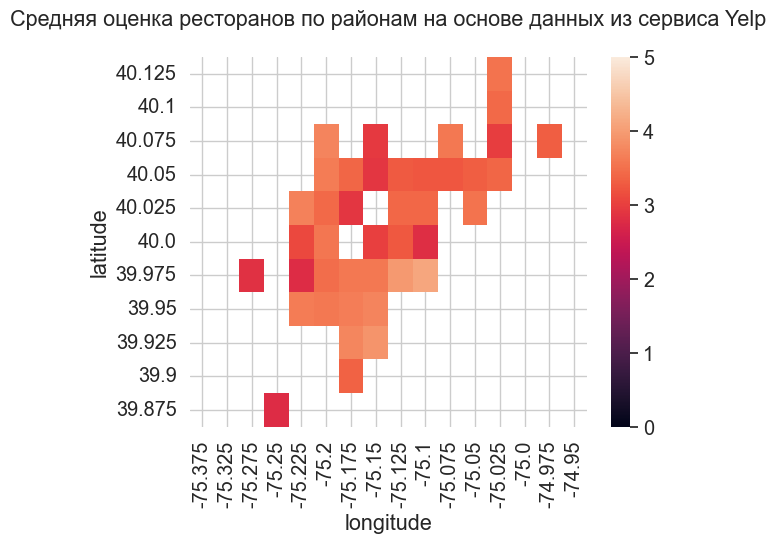

In [627]:
heatmap_rating = sns.heatmap(rest_mean_rating_map_table, vmin=0, vmax=5)
heatmap_rating.invert_yaxis()
heatmap_rating.set_title("Средняя оценка ресторанов по районам на основе данных из сервиса Yelp\n")
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе помогают получить более объективную оценку, так как районы с небольшим числом ресторанов и завдения с маленьким числом отзывов могут сыграть роль выбросов, смещающих оценку. Кроме того районы с назким числом заведений не имеет смысла наносить на карту.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [628]:
top_rest = philadelphia_sum_table_without_round_lat[
    (philadelphia_sum_table_without_round_lat['categories'].apply(lambda x: x.lower() if x else '').str.contains('restaurant')) &
    (philadelphia_sum_table_without_round_lat['review_count'] >= 50)
].sort_values(
    by='mean_rating', ascending=False
)

top_rest.head(10)

,latitude,longitude,categories,name,mean_rating,review_count
business_id,,,,,,
kT8IlV47kz1rz2lTuNyO1w,39.963081,-75.169360,"Restaurants, Breakfast & Brunch, Delis, Sandwi...",Christie's Deli,4.945205,73
2mkBNO0XdithuGir_qO6Ag,39.936367,-75.155403,"Restaurants, Mexican, Latin American, Salvador...",El Bocado,4.882353,51
kDzp5FXnuG3Pwk6orhfl8A,39.981163,-75.123262,"Restaurants, Pizza",Circles + Squares,4.833333,66
8j5bQ0nDwoGiFaTQDNCQTg,40.028190,-75.035811,"Sandwiches, Restaurants, Salad, Cheesesteaks",Jack's Place,4.788462,52
UMHuKs1sO-wq3XqKaejXeA,39.926515,-75.173776,"Arts & Crafts, Food, Shopping, Food Delivery S...",Miss Rachel's Pantry,4.763636,55
TE2IEDNV0RcI6s1wTOP4fg,39.937636,-75.158082,"Convenience Stores, Italian, Specialty Food, M...",Tortilleria San Roman,4.758065,124
ozOneB4jXOD6hv5WBGj4KQ,39.926355,-75.168937,"Restaurants, Italian",Ristorante Pesto,4.742160,287
4ZKAGQ2U8M4mtONcAg42cQ,39.936313,-75.146899,"Restaurants, Hot Dogs, Bars, Burgers, Beer Bar...",Lucky's Last Chance,4.740741,54
ZForVw2ZTiwDGfZ0XvZsXQ,40.034015,-75.171844,"Cafes, Restaurants, Shopping, Food, Books, Mag...",Uncle Bobbie's Coffee & Books,4.725000,80


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [629]:
top10_rest_busin_id = top_rest.head(10).index


lat = top_rest['latitude']
lon = top_rest['longitude']
company_name = top_rest['name']
business_id = top_rest.index

# создадим объект-карту
map = folium.Map(location=[40.0,-75.12], zoom_start = 9, tiles="Cartodb Positron")

# создаем маркеры и добавляем их к карте
for lat, lon, company_name, business_id in zip(lat, lon, company_name, business_id):
    color = 'red' if business_id in top10_rest_busin_id else 'lightgreen'
    folium.CircleMarker(location=[lat, lon], popup=company_name, radius = 7, fill_color=color, color=None, fill_opacity = 0.2).add_to(map)

# сохрняем карту и отображаем её в ноутбуке
map.save("philadelphia_top_restaurants.html")
map

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** 
* средний рейтинг районов по ресторанам в основном колеблется около 3 звёзд;
* хорошие в основном сосредоточены в центре города;
* не все рестораны из топ 10 по оценке находятся в центре.

В процессе работы мы нашли:
* Город с наибольшим числом компаний. Им окзалась Филадельфия.
* Районы города с хорошим качеством услуг.
* Местоположение лучших ресторанов Филадельфии на основе отзывов.